In [1]:
import numpy as np
import random
import sys


In [2]:
import keras
import keras.backend as K
from keras import layers, models, callbacks, optimizers

C:\Users\LENOVO\AppData\Local\Continuum\anaconda3\envs\deep_learning\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [ ]:
def reweight_distribution(distributions, temperature=0.5):
    new_dist = np.log(distributions) / temperature
    new_dist = np.exp(new_dist)
    return new_dist / np.sum(new_dist)

#### Implementing character-level LSTM text generation

In [3]:
path = keras.utils.get_file(fname='nietzsche.txt', 
                            origin='https://s3.amazonaws.com/text-datasets/nietzsche.txt')

with open(path, 'r') as f:
    text = f.read().lower()

print("Corpus length:", len(text))

max_length = 60
step = 3

sequences = []
next_chars = []

for i in range(0, len(text) - max_length, step):
    sequences.append(text[i:i+max_length])
    next_chars.append(text[i+max_length])
    
char_set = set(list(text))
char2idx = {c:i for i,c in enumerate(char_set)}

idx2char = {i:c for i,c in enumerate(char_set)}

print("Unique characters:", len(char_set))

x = np.zeros(shape=(len(sequences), max_length, len(char_set)), dtype=np.bool)
y = np.zeros(shape=(len(sequences), len(char_set)), dtype=np.bool)

for i, (seq, c) in enumerate(zip(sequences, next_chars)):
    y[i, char2idx[c]] = 1
    for t, c in enumerate(seq):
        x[i, t, char2idx[c]] = 1

# build model

K.clear_session()

model = models.Sequential()
model.add(layers.LSTM(units=128, input_shape=(max_length, len(char_set))))
model.add(layers.Dense(units=len(char_set), activation='softmax'))

model.summary()

optimizer = optimizers.RMSprop(lr=0.01)
model.compile(loss='categorical_crossentropy', optimizer=optimizer)

def sampling(preds, temperature=1.0):
    preds = np.asarray(preds).astype('float64')
    preds = np.log(preds) / temperature
    preds = np.exp(preds)
    preds =  preds / np.sum(preds)
    return np.random.choice(len(preds), size=1, p=preds)[0]


i = random.randint(0, len(text)-max_length)
generated_text = text[i:i+max_length]
print("--- Generating with seed: [{}]".format(generated_text))

print('Epoch: 1')
print('#'*100)
model.fit(x, y, batch_size=64, epochs=1, verbose=0, shuffle=True)

for temperature in [.2, .5, 1.]:
    print("--- temperature: [{}]".format(temperature))
    # generate 400 characters
    current_text = generated_text
    sys.stdout.write(current_text)
    for i in range(400):

        # update latest samples for prediction
        samples = np.zeros(shape=(1, max_length, len(char_set)))
        for t, c in enumerate(current_text[-max_length:]):
            samples[0, t, char2idx[c]] = 1.

        preds = model.predict(samples)[0]
        idx = sampling(preds, temperature)
        next_char = idx2char[idx]
        current_text += next_char
        sys.stdout.write(next_char)
    print()
    print('//' * 50)
print('-'*100)


# fitting next 59 epochs
model.fit(x, y, batch_size=64, epochs=59, verbose=1, shuffle=True)
print('Epoch: 60')
print('#'*100)

for temperature in [.2, .5, 1.]:
    print("--- temperature: [{}]".format(temperature))
    # generate 400 characters
    current_text = generated_text
    sys.stdout.write(current_text)
    for i in range(400):

        # update latest samples for prediction
        samples = np.zeros(shape=(1, max_length, len(char_set)))
        for t, c in enumerate(current_text[-max_length:]):
            samples[0, t, char2idx[c]] = 1.

        preds = model.predict(samples)[0]
        idx = sampling(preds, temperature)
        next_char = idx2char[idx]
        current_text += next_char
        sys.stdout.write(next_char)
    print()
    print('//' * 50)
print('-'*100)


Corpus length: 600901
Unique characters: 59
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 128)               96256     
_________________________________________________________________
dense_1 (Dense)              (None, 59)                7611      
Total params: 103,867
Trainable params: 103,867
Non-trainable params: 0
_________________________________________________________________
--- Generating with seed: [ unknown to most thinkers and scholars from their own
experi]
Epoch: 1
####################################################################################################
--- temperature: [0.2]
 unknown to most thinkers and scholars from their own
experient of the senticarity, which the sention of the sentical to the something to the streater to all the streater and the streater to the sentication of the sentication of the sention of the something to the s

experite  u :

C:\Users\LENOVO\AppData\Local\Continuum\anaconda3\envs\deep_learning\lib\site-packages\ipykernel\__main__.py:49: RuntimeWarning: divide by zero encountered in log


at  eot b as t f t andt  te t  the t  aeo y  ho t n t ae s ahe ara t h t aer th the oa at hit"h t nt ma t t  we t aa tef th  f are  te a ao  b th te r a th ta tao t  a wat ine t    at the te t  t to th at  e e t t   o n t e  aoto  ae o  e anarb io   t" t o o"   t he we e t an an e, o t oa  t tceat thb te a te o ar a ne nt t inde hat n to m nene trr th tiue  ae a o o e   atb  anof b an anee 
////////////////////////////////////////////////////////////////////////////////////////////////////
--- temperature: [0.5]
 unknown to most thinkers and scholars from their own
experit and id  oen  n the th aaewitt o ore  aheeeeriewoe i thde  oe lt he s i  ! noio h  a r th  at= orsya a re ttre creiio  n i  o 'sg te  p  at or t taao . aio i win olio  nhinof te b ain t    e ht eeat tth t i o o an  i ndie an i a  aae aaoe at foti   teaoi af ot il oe  re  nteat e tofia t tu o of o  hat=na d f ei osei n o eif on rtt s ia no o o a ieee ir natee aee eh  oeeane can th t oer t o
so td 
/////////////////////

#### DeepDream

In [9]:
import keras.backend as K
from keras.applications import inception_v3
import numpy as np
from keras.utils import plot_model

In [5]:
K.set_learning_phase(0)

model = inception_v3.InceptionV3(include_top=False, 
                                 weights='imagenet')

87916544/87910968 [==============================] - 175s 2us/step


In [6]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, None, None, 3 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, None, None, 3 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

In [7]:
layer_dict = {layer.name:layer for layer in model.layers}

In [8]:
layer_dict

{'activation_1': <keras.layers.core.Activation at 0x26d4c8b6748>,
 'activation_10': <keras.layers.core.Activation at 0x26df2f20080>,
 'activation_11': <keras.layers.core.Activation at 0x26df3028f28>,
 'activation_12': <keras.layers.core.Activation at 0x26df30de780>,
 'activation_13': <keras.layers.core.Activation at 0x26df3205e10>,
 'activation_14': <keras.layers.core.Activation at 0x26df32e8128>,
 'activation_15': <keras.layers.core.Activation at 0x26df33fe208>,
 'activation_16': <keras.layers.core.Activation at 0x26df35ee978>,
 'activation_17': <keras.layers.core.Activation at 0x26df3708ac8>,
 'activation_18': <keras.layers.core.Activation at 0x26df3822c18>,
 'activation_19': <keras.layers.core.Activation at 0x26df38aaf98>,
 'activation_2': <keras.layers.core.Activation at 0x26d4c9007b8>,
 'activation_20': <keras.layers.core.Activation at 0x26df39cfa90>,
 'activation_21': <keras.layers.core.Activation at 0x26df3b7cac8>,
 'activation_22': <keras.layers.core.Activation at 0x26df3c96c18

In [67]:
from keras.preprocessing import image
import scipy
import imageio


def preprocess_image(image_path):
    img = image.load_img(image_path)
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = inception_v3.preprocess_input(img)
    return img


def deprocess_image(img):
    
    # reshape to [H,W,C]
    img = np.squeeze(img, axis=0)
    if K.image_data_format() == 'channels_first':
        img = np.transpose(img, axes=[1, 2, 0])
        
    # deprocess image: inverse inception_v3.preprocess_input
    img += 1
    img /= 2.
    img *= 255.
    img = np.clip(img, a_min=0, a_max=255).astype('uint8')
    return img


def resize_img(img, size):
    img = np.copy(img)
    factors = [1, 
               size[0]/img.shape[1], 
               size[1]/img.shape[2] , 
               1]
    return scipy.ndimage.zoom(img, factors, order=1)


def save_img(img, fname):
    pil_img = deprocess_image(np.copy(img))
    imageio.imwrite(fname, pil_img)

In [78]:
import random

In [180]:
layer_contributions = dict(zip(np.random.choice(list(k for k in layer_dict.keys() if k.startswith('mixed')), size=4), 
                               [2., 2., 2., 2.]))
layer_contributions

{'mixed1': 2.0, 'mixed2': 2.0, 'mixed3': 2.0, 'mixed9': 2.0}

In [181]:
'''
layer_contributions = {
    'mixed5': 2.,
    'mixed6': 2.,
    'mixed1': 2.,
    'mixed2': 2.
}
'''
# define the loss to maximized

loss = K.variable(0.)
for layer_name, coef in layer_contributions.items():
    activation = layer_dict[layer_name].output
    
    scaling = K.prod(K.cast(K.shape(activation), 'float32'))
    l2 = K.sum(K.square(activation[:, 2:-2, 2:-2, :])) / scaling
    
    loss += coef * l2

# Gradient-ascent process

dream = model.input

grads = K.gradients(loss, dream)[0]

grads /= K.maximum(K.mean(K.abs(grads)), 1e-7)

outputs = [loss, grads]

fetch_loss_and_grads = K.function(inputs=[dream], outputs=outputs)


def gradient_ascent(x, n_iters, step, max_loss=None):
    
    for i in range(n_iters):
        loss_, grads_ = fetch_loss_and_grads([x])
        if (max_loss is not None) and (loss_ > max_loss):
            break
        x += step * grads_
        print("Loss at {:2d} steps: {:.4f}".format(i+1, loss_))
    return x

In [182]:
# running gradient ascent over different successive scales
n_iters = 20
step = 0.01
max_loss = 10.
num_octave = 3
octave_scale = 1.4

img = preprocess_image('sky.jpg')

original_img = np.copy(img)
original_shape = img.shape[1:3]    # (H, W)

successive_shapes = [original_shape]
for i in range(1, num_octave):
    shape = tuple(int(dim/(octave_scale**i)) for dim in original_shape)
    successive_shapes.append(shape)
successive_shapes = successive_shapes[::-1]     # from shrunk -> original shape

shrunk_original = resize_img(original_img, size=successive_shapes[0])

for shape in successive_shapes:
    
    print("Processing image shape", shape)
    # gradient ascent: at current shape
    img = resize_img(img, shape)
    img = gradient_ascent(img, n_iters=n_iters, 
                          step=step, max_loss=max_loss)
    
    # recover image loss
    upscale_shrunk_orginal = resize_img(shrunk_original, size=shape)
    resize_original = resize_img(original_img, size=shape)
    img_loss = resize_original - upscale_shrunk_orginal
    
    img += img_loss
    
    # update shrunk_original to current shape
    shrunk_original = resize_img(original_img, shape)
    save_img(img, fname="dream_at_scale_" + str(shape) + '.png')
    
save_img(img, fname='final_dream_rand.png')

Processing image shape (551, 979)
Loss at  1 steps: 2.6349
Loss at  2 steps: 3.0691
Loss at  3 steps: 3.6127
Loss at  4 steps: 4.2374
Loss at  5 steps: 4.8636
Loss at  6 steps: 5.4845
Loss at  7 steps: 6.0887
Loss at  8 steps: 6.6927
Loss at  9 steps: 7.2678
Loss at 10 steps: 7.8223
Loss at 11 steps: 8.3590
Loss at 12 steps: 8.8708
Loss at 13 steps: 9.3744
Loss at 14 steps: 9.8448
Processing image shape (771, 1371)
Loss at  1 steps: 4.3388
Loss at  2 steps: 5.3818
Loss at  3 steps: 6.1717
Loss at  4 steps: 6.8716
Loss at  5 steps: 7.5303
Loss at  6 steps: 8.1173
Loss at  7 steps: 8.6813
Loss at  8 steps: 9.2056
Loss at  9 steps: 9.7194
Processing image shape (1080, 1920)
Loss at  1 steps: 4.4461
Loss at  2 steps: 5.4342
Loss at  3 steps: 6.1503
Loss at  4 steps: 6.8367
Loss at  5 steps: 7.4630
Loss at  6 steps: 8.0517
Loss at  7 steps: 8.6097
Loss at  8 steps: 9.1391
Loss at  9 steps: 9.6457


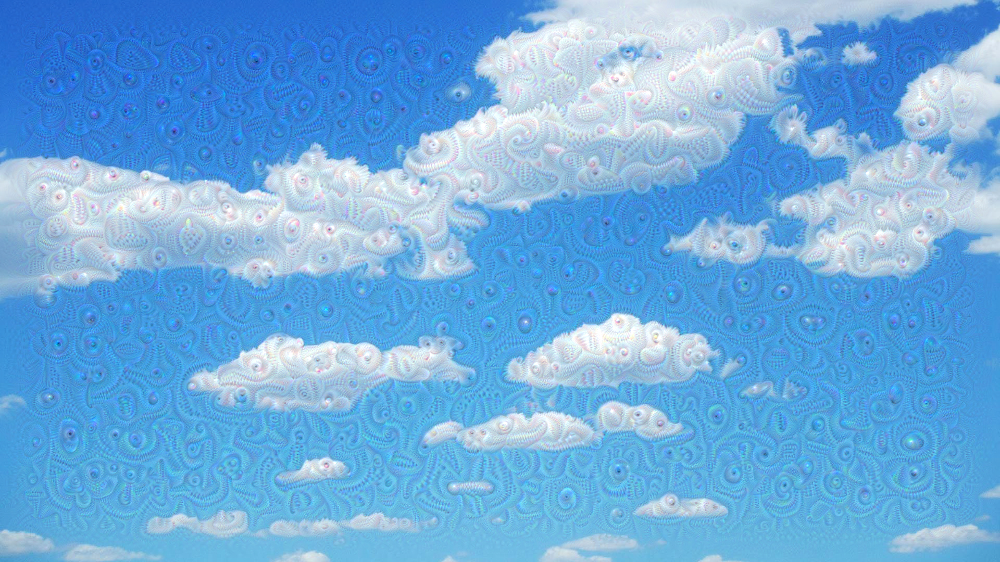

In [59]:
image.load_img('final_dream.png')

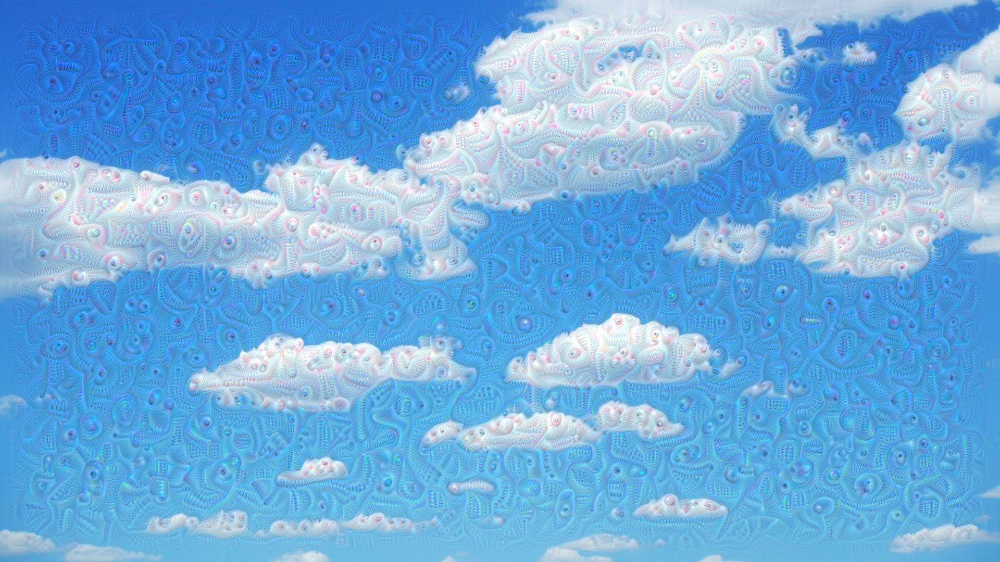

In [183]:
image.load_img('final_dream_rand.png')

#### Neural style transfer

In [92]:
import numpy as np
from keras.applications import vgg19
from keras.preprocessing.image import load_img, img_to_array
import keras.backend as K

In [93]:
K.clear_session()

In [94]:
target_image_path = 'steve_jobs_albert-watson.jpg'
style_image_path = 'style_1.jpg'

In [95]:
def preprocess_image(img_path, size):
    img = load_img(img_path, target_size=size)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    return vgg19.preprocess_input(img)

def deprocess_image(img):
    # reverse vgg19.preprocess_input
    img[:, :, 0] += 103.939
    img[:, :, 1] += 116.779
    img[:, :, 2] += 123.68
    img = img[:,:, ::-1]
    img = np.clip(img, 0, 255).astype('uint8')
    return img

In [96]:
width, height = load_img(target_image_path).size
im_height = 400
im_width = int(width*im_height/height)
im_size = (im_height, im_width)

In [97]:
#loading the pretrained VGG19 network and applying it to the three image
content_img = K.constant(preprocess_image(target_image_path, im_size))
style_img = K.constant(preprocess_image(style_image_path, im_size))
gen_img = K.placeholder(shape=(1, im_height, im_width, 3))

In [98]:
content_img, style_img, gen_img

(<tf.Tensor 'Const:0' shape=(1, 400, 400, 3) dtype=float32>,
 <tf.Tensor 'Const_1:0' shape=(1, 400, 400, 3) dtype=float32>,
 <tf.Tensor 'Placeholder:0' shape=(1, 400, 400, 3) dtype=float32>)

In [99]:
input_tensor = K.concatenate([content_img, style_img, gen_img], axis=0)

In [100]:
input_tensor

<tf.Tensor 'concat:0' shape=(3, 400, 400, 3) dtype=float32>

In [101]:
model = vgg19.VGG19(include_top=False, 
                    weights='imagenet', 
                    input_tensor=input_tensor)

In [102]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

In [103]:
def content_loss(base, gen):
    return K.sum(K.square(base - gen))

def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, pattern=(2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

def style_loss(base, gen):
    S = gram_matrix(base)
    G = gram_matrix(gen)
    denom = 3 * im_height * im_width
    return content_loss(S, G) / (4. * (denom**2))
        
def total_variation_loss(x):
    a = K.square(x[:, :im_height-1, :im_width-1, :] - 
                 x[:, 1:, :im_width-1, :])
    b = K.square(x[:, :im_height-1, :im_width-1, :] - 
                 x[:, :im_height-1, 1:, :])
    return K.sum(K.pow(a+b, 1.25))

In [104]:
# define the final loss
output_dict = {layer.name:layer.output for layer in model.layers}

In [105]:
output_dict

{'block1_conv1': <tf.Tensor 'block1_conv1/Relu:0' shape=(3, 400, 400, 64) dtype=float32>,
 'block1_conv2': <tf.Tensor 'block1_conv2/Relu:0' shape=(3, 400, 400, 64) dtype=float32>,
 'block1_pool': <tf.Tensor 'block1_pool/MaxPool:0' shape=(3, 200, 200, 64) dtype=float32>,
 'block2_conv1': <tf.Tensor 'block2_conv1/Relu:0' shape=(3, 200, 200, 128) dtype=float32>,
 'block2_conv2': <tf.Tensor 'block2_conv2/Relu:0' shape=(3, 200, 200, 128) dtype=float32>,
 'block2_pool': <tf.Tensor 'block2_pool/MaxPool:0' shape=(3, 100, 100, 128) dtype=float32>,
 'block3_conv1': <tf.Tensor 'block3_conv1/Relu:0' shape=(3, 100, 100, 256) dtype=float32>,
 'block3_conv2': <tf.Tensor 'block3_conv2/Relu:0' shape=(3, 100, 100, 256) dtype=float32>,
 'block3_conv3': <tf.Tensor 'block3_conv3/Relu:0' shape=(3, 100, 100, 256) dtype=float32>,
 'block3_conv4': <tf.Tensor 'block3_conv4/Relu:0' shape=(3, 100, 100, 256) dtype=float32>,
 'block3_pool': <tf.Tensor 'block3_pool/MaxPool:0' shape=(3, 50, 50, 256) dtype=float32>,
 

In [106]:
content_layer = 'block5_conv2'
style_layers = [
    'block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1'
]


reg_weight = 1e-4
content_weight = .025
style_weight = 1.

In [107]:
loss = K.variable(0.)

# content output
outputs = output_dict[content_layer]
content_output = outputs[0, :, :, :]
gen_output = outputs[2, :, :, :]

loss += content_weight * content_loss(content_output, gen_output)

# style outputs
for layer in style_layers:
    outputs = output_dict[layer]
    style_output = outputs[1, :, :, :]
    gen_output = outputs[2, :, :, :]
    loss += (style_weight/len(style_layers)) * style_loss(style_output, gen_output)

# regularize loss
loss += reg_weight * total_variation_loss(gen_img)

In [108]:
# Setting up the gradient-descent process
grads = K.gradients(loss, gen_img)[0]
fetch_grads_loss = K.function(inputs=[gen_img], outputs=[grads, loss])

class Evaluator:
    '''
    helper class for updating and holding loss and gradients values as callabel form
    using in fmin_l_bfgs_b function
    '''
    
    def __init__(self):
        self.loss_ = None
        self.grads_ = None
        
    def loss(self, x):
        assert self.loss_ is None
        x = np.reshape(x, newshape=(1, im_height, im_width, 3))
        grads, loss = fetch_grads_loss([x])
        self.loss_ = loss
        self.grads_ = grads.flatten().astype('float64')
        return self.loss_
    
    def grads(self, x):
        assert self.loss_ is not None
        grads = np.copy(self.grads_)
        self.grads_ = None
        self.loss_ = None
        return grads
    
evaluator = Evaluator()

In [109]:
from scipy.optimize import fmin_l_bfgs_b
#from scipy.misc import imsave
from imageio import imsave
import time

In [111]:
# style-transfer loop
t0 = time.time()
result_prefix = 'my_result'
n_iters = 100

# init gen_image
x = preprocess_image(target_image_path, im_size)
x = x.flatten()

for i in range(n_iters):
    print("Iteration: ", i+1)
    x, min_loss, info = fmin_l_bfgs_b(evaluator.loss, 
                                      x, 
                                      fprime=evaluator.grads, 
                                      maxfun=20)
    print("Current loss value: {:.4f}".format(min_loss))
    
    img = np.copy(x).reshape((im_height, im_width, 3))
    img = deprocess_image(img)
    fname = result_prefix + "_iter_{}.png".format(i+1)
    imsave(fname, img)
    
print("completed in {}s".format(time.time() - t0))

Iteration:  1
Current loss value: 3429946880.0000
Iteration:  2
Current loss value: 1867900416.0000
Iteration:  3
Current loss value: 1334653696.0000
Iteration:  4
Current loss value: 1085943424.0000
Iteration:  5
Current loss value: 919971776.0000
Iteration:  6
Current loss value: 820682624.0000
Iteration:  7
Current loss value: 745739776.0000
Iteration:  8
Current loss value: 689898880.0000
Iteration:  9
Current loss value: 644819776.0000
Iteration:  10
Current loss value: 609313472.0000
Iteration:  11
Current loss value: 575579136.0000
Iteration:  12
Current loss value: 544405440.0000
Iteration:  13
Current loss value: 521073184.0000
Iteration:  14
Current loss value: 500310592.0000
Iteration:  15
Current loss value: 483018144.0000
Iteration:  16
Current loss value: 466266432.0000
Iteration:  17
Current loss value: 451916224.0000
Iteration:  18
Current loss value: 439559520.0000
Iteration:  19
Current loss value: 423055744.0000
Iteration:  20
Current loss value: 410549568.0000
Itera

#### Variational autoencoders

In [58]:
import keras.backend as K
from keras import layers, models, metrics
import numpy as np
from keras.datasets import mnist
from scipy.stats import norm

import matplotlib.pyplot as plt
%matplotlib inline

In [70]:
K.clear_session()

im_shape = (28, 28, 1)
batch_size = 16
latent_dim = 2

# encoder net
input_x = layers.Input(shape=im_shape)
x = layers.Conv2D(32, kernel_size=3, strides=1, padding='same', activation='relu')(input_x)
x = layers.Conv2D(64, kernel_size=3, strides=2, padding='same', activation='relu')(x)
x = layers.Conv2D(64, kernel_size=3, strides=1, padding='same', activation='relu')(x)
x = layers.Conv2D(64, kernel_size=3, strides=1, padding='same', activation='relu')(x)
shape_before_flatten = K.int_shape(x)
x = layers.Flatten()(x)
x = layers.Dense(32)(x)

z_mean = layers.Dense(latent_dim)(x)
z_log_var = layers.Dense(latent_dim)(x)

# sampling function
def sampling(args):
    mean, log_var = args
    epsilon = K.random_normal(shape=(K.shape(mean)[0], latent_dim), mean=0.0, stddev=1.0)
    return mean + epsilon*K.exp(log_var)

z = layers.Lambda(sampling)([z_mean, z_log_var])

# decoder net
input_z = layers.Input(shape=K.int_shape(z)[1:])

x = layers.Dense(units=np.prod(shape_before_flatten[1:]), activation='relu')(input_z)
x = layers.Reshape(shape_before_flatten[1:])(x)
x = layers.Conv2DTranspose(filters=32, kernel_size=3, padding='same', strides=2, activation='relu')(x)
x = layers.Conv2D(filters=1, kernel_size=3, padding='same', activation='sigmoid')(x)

decoder = models.Model(input_z, x)

z_decoded = decoder(z)

class CustomVariationalLayer(layers.Layer):
    
    def vae_loss(self, x, z_decoded):
        x = K.flatten(x)
        z_decoded = K.flatten(z_decoded)
        xent_loss = metrics.binary_crossentropy(x, z_decoded)
        kl_loss = -5e-4 * K.mean(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
        return K.mean(xent_loss + kl_loss)
    
    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        return x

y = CustomVariationalLayer()([input_x, z_decoded])

vae = models.Model(input_x, y)
vae.compile(optimizer='rmsprop', loss=None)

vae.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 28, 28, 32)   320         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 14, 14, 64)   18496       conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 14, 14, 64)   36928       conv2d_2[0][0]                   
__________________________________________________________________________________________________
conv2d_4 (

C:\Users\LENOVO\AppData\Local\Continuum\anaconda3\envs\deep_learning\lib\site-packages\ipykernel\__main__.py:59: UserWarning: Output "custom_variational_layer_1" missing from loss dictionary. We assume this was done on purpose, and we will not be expecting any data to be passed to "custom_variational_layer_1" during training.


In [45]:
# prepare data
(x_train, _), (x_test, _) = mnist.load_data()

In [49]:
x_train = x_train.astype('float32')/ 255.
x_test = x_test.astype('float32') / 255.
x_train = x_train[:, :, :, None]
x_test = x_test[:, :, :, None]

In [51]:
x_train.shape, x_test.shape

((60000, 28, 28, 1), (10000, 28, 28, 1))

In [71]:
history = vae.fit(x_train, y=None, 
                  shuffle=True,
                  batch_size=batch_size, 
                  epochs=10, 
                  validation_data=(x_test, None))

Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 73s 1ms/step - loss: 0.2859 - val_loss: 0.1979
Epoch 2/10
60000/60000 [==============================] - 74s 1ms/step - loss: 0.1946 - val_loss: 0.1908
Epoch 3/10
60000/60000 [==============================] - 72s 1ms/step - loss: 0.1909 - val_loss: 0.1897
Epoch 4/10
60000/60000 [==============================] - 74s 1ms/step - loss: 0.1888 - val_loss: 0.1890
Epoch 5/10
60000/60000 [==============================] - 76s 1ms/step - loss: 0.1873 - val_loss: 0.1885
Epoch 6/10
60000/60000 [==============================] - 77s 1ms/step - loss: 0.1862 - val_loss: 0.1859
Epoch 7/10
60000/60000 [==============================] - 76s 1ms/step - loss: 0.1853 - val_loss: 0.1854
Epoch 8/10
60000/60000 [==============================] - 72s 1ms/step - loss: 0.1846 - val_loss: 0.1850
Epoch 9/10
60000/60000 [==============================] - 74s 1ms/step - loss: 0.1840 - val_loss: 0.1838
Epoch

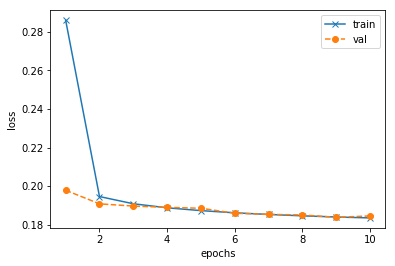

In [72]:
tr_loss, val_loss = history.history['loss'], history.history['val_loss']
xs = range(1, len(tr_loss)+1)

plt.plot(xs, tr_loss, 'x-', label='train')
plt.plot(xs, val_loss, 'o--', label='val')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(loc='best')

In [73]:
vae.save('vae_1.h5')

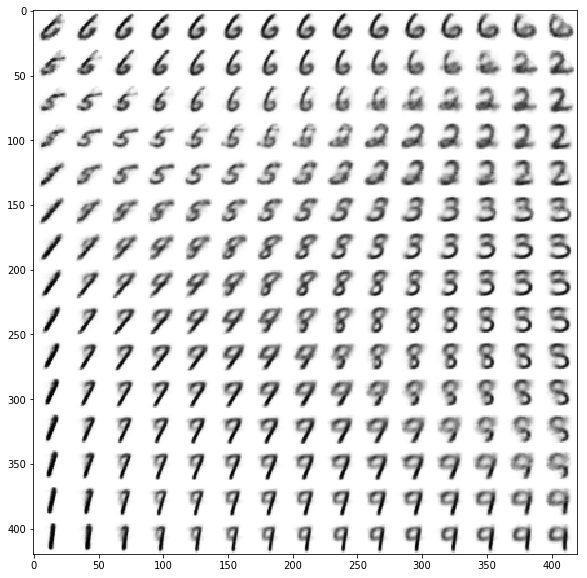

In [74]:
n = 15
size = 28

display = np.zeros(shape=(n*size, n*size))
grid_x = norm.ppf(np.linspace(.05, .95, n))
grid_y = norm.ppf(np.linspace(.05, .95, n))

for c, xi in enumerate(grid_x):
    for r, yi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        z_sample = np.tile(z_sample, reps=batch_size).reshape((batch_size, -1))
        x_decoded = decoder.predict(z_sample, batch_size=batch_size)
        digit = x_decoded[0].reshape((size, size))
        
        display[r*size:(r+1)*size, c*size:(c+1)*size] = digit
        
plt.figure(figsize=(10,10))
plt.imshow(display, cmap=plt.cm.gray_r)
plt.show()

array([[0, 1, 0, 1, 0, 1]])

In [50]:
### my vae
import keras.backend as K
from keras import layers, models, metrics, objectives
import numpy as np
from keras.datasets import mnist
from scipy.stats import norm

import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
# preprocess data
(x_train, _), (x_test, _) = mnist.load_data()
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
x_train = x_train[:, :, :, None]
x_test = x_test[:, :, :, None]

x_train.shape, x_test.shape

((60000, 28, 28, 1), (10000, 28, 28, 1))

In [40]:
K.clear_session()

H, W, C = 28, 28, 1
n_dim = 2
batch_size = 16

# Encoder
x_input = layers.Input(shape=(H, W, C))
x = layers.Conv2D(32, kernel_size=3, strides=1, padding='same', activation='relu')(x_input)
x = layers.Conv2D(64, kernel_size=3, strides=2, padding='same', activation='relu')(x)
x = layers.Conv2D(64, kernel_size=3, strides=1, padding='same', activation='relu')(x)
x = layers.Conv2D(64, kernel_size=3, strides=1, padding='same', activation='relu')(x)

before_flatten = K.int_shape(x)
x = layers.Flatten()(x)
after_flatten = K.int_shape(x)

x = layers.Dense(units=32, activation='relu')(x)

z_mean = layers.Dense(n_dim)(x)
z_log_var = layers.Dense(n_dim)(x)

Encoder = models.Model(x_input, [z_mean, z_log_var])

# Decoder

def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=K.shape(z_log_var), mean=0.0, stddev=1.0)
    return z_mean + K.exp(z_log_var)*epsilon



z_input = layers.Input(shape=K.int_shape(z)[1:])
x = layers.Dense(units=after_flatten[-1], activation='relu')(z_input)
x = layers.Reshape(target_shape=before_flatten[1:])(x)
x = layers.Conv2DTranspose(filters=32, kernel_size=3, strides=2, padding='same', activation='relu')(x)
x_output = layers.Conv2D(filters=1, kernel_size=3, strides=1, padding='same', activation='sigmoid')(x)

Decoder = models.Model(z_input, x_output)

In [41]:
def vae_loss(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    xentropy_loss = K.sum(K.binary_crossentropy(y_true, y_pred))
    KL_loss = 0.5*K.sum(K.exp(log_var) + K.square(mean) - 1. - log_var, axis=-1)
    return KL_loss + xentropy_loss

In [42]:
mean, log_var = Encoder(x_input)
z = layers.Lambda(sampling)([mean, log_var])
z_out = Decoder(z)

In [43]:
# VAE
VAE = models.Model(x_input, z_out)

In [44]:
VAE.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
model_1 (Model)                 [(None, 2), (None, 2 494244      input_1[0][0]                    
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 2)            0           model_1[1][0]                    
                                                                 model_1[1][1]                    
__________________________________________________________________________________________________
model_2 (Model)                 (None, 28, 28, 1)    56385       lambda_1[0][0]                   
Total para

In [45]:
VAE.compile(optimizer='adam', loss=vae_loss)

In [46]:
history = VAE.fit(x_train, x_train, 
                  batch_size=batch_size, 
                  epochs=10, 
                  validation_data=(x_test, x_test))

Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 106s 2ms/step - loss: 2757.7183 - val_loss: 2506.8793
Epoch 2/10
60000/60000 [==============================] - 94s 2ms/step - loss: 2452.8216 - val_loss: 2421.2800
Epoch 3/10
60000/60000 [==============================] - 91s 2ms/step - loss: 2376.3609 - val_loss: 2343.4502
Epoch 4/10
60000/60000 [==============================] - 97s 2ms/step - loss: 2330.2088 - val_loss: 2314.3957
Epoch 5/10
60000/60000 [==============================] - 97s 2ms/step - loss: 2301.6343 - val_loss: 2288.3672
Epoch 6/10
60000/60000 [==============================] - 95s 2ms/step - loss: 2279.3980 - val_loss: 2277.1720
Epoch 7/10
60000/60000 [==============================] - 93s 2ms/step - loss: 2260.0203 - val_loss: 2249.4323
Epoch 8/10
60000/60000 [==============================] - 98s 2ms/step - loss: 2243.8905 - val_loss: 2245.9170
Epoch 9/10
60000/60000 [==============================] - 89s

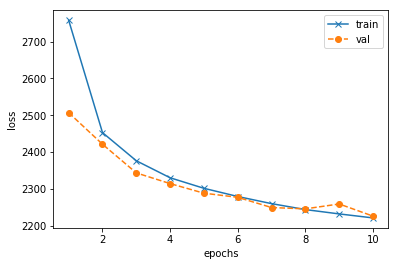

In [48]:
tr_loss, val_loss = history.history['loss'], history.history['val_loss']
xs = range(1, len(tr_loss)+1)

plt.plot(xs, tr_loss, 'x-', label='train')
plt.plot(xs, val_loss, 'o--', label='val')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(loc='best')

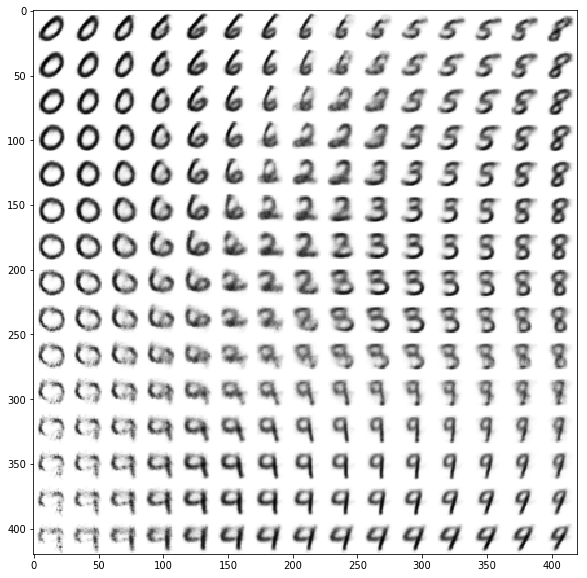

In [51]:
n = 15
size = 28

display = np.zeros(shape=(n*size, n*size))
grid_x = norm.ppf(np.linspace(.05, .95, n))
grid_y = norm.ppf(np.linspace(.05, .95, n))

for c, xi in enumerate(grid_x):
    for r, yi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        z_sample = np.tile(z_sample, reps=batch_size).reshape((batch_size, -1))
        x_decoded = Decoder.predict(z_sample, batch_size=batch_size)
        digit = x_decoded[0].reshape((size, size))
        
        display[r*size:(r+1)*size, c*size:(c+1)*size] = digit
        
plt.figure(figsize=(10,10))
plt.imshow(display, cmap=plt.cm.gray_r)
plt.show()

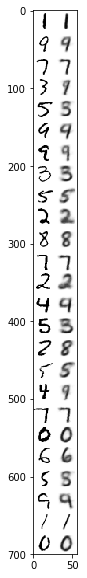

In [112]:
m = 25
a_in = x_test[np.random.randint(low=0, high=500, size=m)]

a_out = VAE.predict(a_in)

display = np.zeros(shape=(m*size, 2*size))

for i, (im1, im2) in enumerate(zip(a_in, a_out)):
    display[i*size:(i+1)*size, :] = np.concatenate((im1[:,:,0], im2[:,:,0]), axis=1)

plt.figure(figsize=(5, 10))
plt.imshow(display, cmap=plt.cm.gray_r)

#### GAN implementation

In [124]:
import numpy as np
import keras.backend as K
from keras import layers, models, optimizers
from keras.datasets import cifar10
from keras.preprocessing import image

import os

In [125]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

In [126]:
x_train.shape, x_test.shape

((50000, 32, 32, 3), (10000, 32, 32, 3))

In [127]:
H, W, C = 32, 32, 3
latent_dim = 32

K.clear_session()

# generator net
generator_input = layers.Input(shape=(latent_dim, ))
x = layers.Dense(units=16*16*128)(generator_input)
x = layers.LeakyReLU()(x)
x = layers.Reshape((16, 16, 128))(x)

x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2DTranspose(256, 4, strides=2, padding='same')(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2D(C, 7, activation='tanh', padding='same')(x)

generator = models.Model(generator_input, x)

generator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32768)             1081344   
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32768)             0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 256)       819456    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 256)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 32, 32, 256)       1048832   
__________

In [128]:
# discriminator net
discriminator_input = layers.Input(shape=(H, W, C))

x = layers.Conv2D(128, 3)(discriminator_input)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)

x = layers.Flatten()(x)
x = layers.Dropout(rate=.5)(x)
x = layers.Dense(1, activation='sigmoid')(x)

discriminator = models.Model(discriminator_input, x)
d_optimizer = optimizers.RMSprop(lr=.001, decay=3e-8, clipvalue=1.0)
discriminator.compile(loss='binary_crossentropy', optimizer=d_optimizer)
discriminator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 30, 30, 128)       3584      
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 30, 30, 128)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 14, 14, 128)       262272    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 14, 14, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 6, 6, 128)         262272    
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 6, 6, 128)         0         
__________

In [129]:
# GAN net
gan_input = layers.Input(shape=(latent_dim,))
gan_output = discriminator(generator(gan_input))
discriminator.trainable = False

gan = models.Model(gan_input, gan_output)
gan_optimizer = optimizers.RMSprop(lr=0.0004, clipvalue=1.0, decay=3e-8)
gan.compile(loss='binary_crossentropy', optimizer=gan_optimizer)

In [130]:
gan.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 32)                0         
_________________________________________________________________
model_1 (Model)              (None, 32, 32, 3)         6264579   
_________________________________________________________________
model_2 (Model)              (None, 1)                 790913    
Total params: 7,055,492
Trainable params: 6,264,579
Non-trainable params: 790,913
_________________________________________________________________


In [131]:
# prepare data
x_train = x_train[y_train.flatten() == 6]     # only frog images

In [132]:
x_train = x_train.astype('float32') / 255.

In [133]:
x_train.shape, x_train.dtype, x_train.max()

((5000, 32, 32, 3), dtype('float32'), 1.0)

In [134]:
iterations = 10000
batch_size = 20
save_dir = 'frog_gan'

start = 0
for i in range(iterations):
    
    # train discriminator
    rand_latent_vec = np.random.normal(loc=0.0, scale=1.0, 
                                       size=(batch_size, latent_dim))
    fake_images = generator.predict(rand_latent_vec)
    real_images = x_train[start:start+batch_size]
    combined_images = np.concatenate((real_images, fake_images), axis=0)
    labels = np.concatenate((np.ones((batch_size, 1)), np.zeros((batch_size, 1))))
    labels += .05 * np.random.random(labels.shape)
    
    d_loss = discriminator.train_on_batch(combined_images, labels)
    
    # train gan
    rand_latent_vec = np.random.normal(loc=0.0, scale=1.0, 
                                       size=(batch_size, latent_dim))
    labels = np.zeros((batch_size, 1))
    
    g_loss = gan.train_on_batch(rand_latent_vec, labels)
    
    # update step
    start += batch_size
    if start > len(x_train) - batch_size:
        start = 0
        
    if i % 100 == 0:
        gan.save_weights("gan.h5")
        
        print("Discriminator Loss: {:.5f}, Adversarial Loss: {:.5f}".format(d_loss, g_loss))
        
        gen_img = image.array_to_img(fake_images[0] * 255., scale=False)
        real_img = image.array_to_img(real_images[0]*255., scale=False)
        
        gen_img.save(os.path.join(save_dir, "generated_frog_{}.png".format(i)))
        real_img.save(os.path.join(save_dir, "real_frog_{}.png".format(i)))

C:\Users\LENOVO\AppData\Local\Continuum\anaconda3\envs\deep_learning\lib\site-packages\keras\engine\training.py:973: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Discriminator Loss: 0.69317, Adversarial Loss: 0.74164
Discriminator Loss: -0.01019, Adversarial Loss: 0.00000
Discriminator Loss: -0.02860, Adversarial Loss: 0.00000
Discriminator Loss: -0.01806, Adversarial Loss: 0.00000
Discriminator Loss: 0.03873, Adversarial Loss: 0.00000
Discriminator Loss: 0.05384, Adversarial Loss: 0.00000
Discriminator Loss: 0.00788, Adversarial Loss: 0.00000
Discriminator Loss: 0.01928, Adversarial Loss: 0.00000
Discriminator Loss: 0.02118, Adversarial Loss: 0.00000
Discriminator Loss: 0.05480, Adversarial Loss: 0.00000
Discriminator Loss: 0.02293, Adversarial Loss: 0.00000
Discriminator Loss: 0.03474, Adversarial Loss: 0.00000
Discriminator Loss: -0.03478, Adversarial Loss: 0.00000
Discriminator Loss: 0.05055, Adversarial Loss: 0.00000
Discriminator Loss: 0.07465, Adversarial Loss: 0.00000
Discriminator Loss: -0.01765, Adversarial Loss: 0.00000
Discriminator Loss: -0.00189, Adversarial Loss: 0.00000
Discriminator Loss: -0.02050, Adversarial Loss: 0.00000
Dis